# CUSTOMER TRANSACTION PREDICTION

## Business Case: Based on given feature of dataset we need to predict which customers will make a specific transaction in the future, irrespective of the amount of money transacted.

### TASK: BINARY CLASSIFICATION TASK

### IMPORTING THE PYTHON LIBRARY

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

### LOAD DATA

In [2]:
data = pd.read_csv("customer_data.csv")
pd.set_option('display.max_columns',None)
data.head()

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,-4.9200,5.7470,2.9252,3.1821,14.0137,0.5745,8.7989,14.5691,5.7487,-7.2393,4.2840,30.7133,10.5350,16.2191,2.5791,2.4716,14.3831,13.4325,-5.1488,-0.4073,4.9306,5.9965,-0.3085,12.9041,-3.8766,16.8911,11.1920,10.5785,0.6764,7.8871,4.6667,3.8743,-5.2387,7.3746,11.5767,12.0446,11.6418,-7.0170,5.9226,-14.2136,16.0283,5.3253,12.9194,29.0460,-0.6940,5.1736,-0.7474,14.8322,11.2668,5.3822,2.0183,10.1166,16.1828,4.9590,2.0771,-0.2154,8.6748,9.5319,5.8056,22.4321,5.0109,-4.7010,21.6374,0.5663,5.1999,8.8600,43.1127,18.3816,-2.3440,23.4104,6.5199,12.1983,13.6468,13.8372,1.3675,2.9423,-4.5213,21.4669,9.3225,16.4597,7.9984,-1.7069,-21.4494,6.7806,11.0924,9.9913,14.8421,0.1812,8.9642,16.2572,2.1743,-3.4132,9.4763,13.3102,26.5376,1.4403,14.7100,6.0454,9.5426,17.1554,14.1104,24.3627,2.0323,6.7602,3.9141,-0.4851,2.5240,1.5093,2.5516,15.5752,-13.4221,7.2739,16.0094,9.7268,0.8897,0.7754,4.2218,12.0039,13.8571,-0.7338,-1.9245,15.4462,12.8287,0.3587,9.6508,6.5674,5.1726,3.1345,29.4547,31.4045,2.8279,15.6599,8.3307,-5.6011,19.0614,11.2663,8.6989,8.3694,11.5659,-16.4727,4.0288,17.9244,18.5177,10.7800,9.0056,16.6964,10.4838,1.6573,12.1749,-13.1324,17.6054,11.5423,15.4576,5.3133,3.6159,5.0384,6.6760,12.6644,2.7004,-0.6975,9.5981,5.4879,-4.7645,-8.4254,20.8773,3.1531,18.5618,7.7423,-10.1245,13.7241,-3.5189,1.7202,-8.4051,9.0164,3.0657,14.3691,25.8398,5.8764,11.8411,-19.7159,17.5743,0.5857,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,train_1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,3.1468,8.0851,-0.4032,8.0585,14.0239,8.4135,5.4345,13.7003,13.8275,-15.5849,7.8000,28.5708,3.4287,2.7407,8.5524,3.3716,6.9779,13.8910,-11.7684,-2.5586,5.0464,0.5481,-9.2987,7.8755,1.2859,19.3710,11.3702,0.7399,2.7995,5.8434,10.8160,3.6783,-11.1147,1.8730,9.8775,11.7842,1.2444,-47.3797,7.3718,0.1948,34.4014,25.7037,11.8343,13.2256,-4.1083,6.6885,-8.0946,18.5995,19.3219,7.0118,1.9210,8.8682,8.0109,-7.2417,1.7944,-1.3147,8.1042,1.5365,5.4007,7.9344,5.0220,2.2302,40.5632,0.5134,3.1701,20.1068,7.7841,7.0529,3.2709,23.4822,5.5075,13.7814,2.5462,18.1782,0.3683,-4.8210,-5.4850,13.7867,-13.5901,11.0993,7.9022,12.2301,0.4768,6.8852,8.0905,10.9631,11.7569,-1.2722,24.7876,26.6881,1.8944,0.6939,-13.6950,8.4068,35.4734,1.7093,15.1866,2.6227,7.3412,32.0888,13.9550,13.0858,6.6203,7.1051,5.3523,8.5426,3.6159,4.1569,3.0454,7.8522,-11.5100,7.5109,31.5899,9.5018,8.2736,10.1633,0.1225,12.5942,14.5697

## DOMAIN ANALYSIS

### INTRODUCTION

With the problem of identification of the customers who will make a transaction with the bank in future, irrespective of the amount of money transacted previously with the bank, the dataset contain 200000 observation with 202 columns with 200 columns having values for var_1 to var_200, one column for ID code and one column for target.

### TARGET COLUMN == TARGET [0, 1]

* 0 Represent -- CUSTOMER DID NOT DO A TRANSACTION

* 1 Represent -- CUSTOMER DID DO THE TRANSACTION

### BASIC CHECKS

In [3]:
data.head()

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,-4.9200,5.7470,2.9252,3.1821,14.0137,0.5745,8.7989,14.5691,5.7487,-7.2393,4.2840,30.7133,10.5350,16.2191,2.5791,2.4716,14.3831,13.4325,-5.1488,-0.4073,4.9306,5.9965,-0.3085,12.9041,-3.8766,16.8911,11.1920,10.5785,0.6764,7.8871,4.6667,3.8743,-5.2387,7.3746,11.5767,12.0446,11.6418,-7.0170,5.9226,-14.2136,16.0283,5.3253,12.9194,29.0460,-0.6940,5.1736,-0.7474,14.8322,11.2668,5.3822,2.0183,10.1166,16.1828,4.9590,2.0771,-0.2154,8.6748,9.5319,5.8056,22.4321,5.0109,-4.7010,21.6374,0.5663,5.1999,8.8600,43.1127,18.3816,-2.3440,23.4104,6.5199,12.1983,13.6468,13.8372,1.3675,2.9423,-4.5213,21.4669,9.3225,16.4597,7.9984,-1.7069,-21.4494,6.7806,11.0924,9.9913,14.8421,0.1812,8.9642,16.2572,2.1743,-3.4132,9.4763,13.3102,26.5376,1.4403,14.7100,6.0454,9.5426,17.1554,14.1104,24.3627,2.0323,6.7602,3.9141,-0.4851,2.5240,1.5093,2.5516,15.5752,-13.4221,7.2739,16.0094,9.7268,0.8897,0.7754,4.2218,12.0039,13.8571,-0.7338,-1.9245,15.4462,12.8287,0.3587,9.6508,6.5674,5.1726,3.1345,29.4547,31.4045,2.8279,15.6599,8.3307,-5.6011,19.0614,11.2663,8.6989,8.3694,11.5659,-16.4727,4.0288,17.9244,18.5177,10.7800,9.0056,16.6964,10.4838,1.6573,12.1749,-13.1324,17.6054,11.5423,15.4576,5.3133,3.6159,5.0384,6.6760,12.6644,2.7004,-0.6975,9.5981,5.4879,-4.7645,-8.4254,20.8773,3.1531,18.5618,7.7423,-10.1245,13.7241,-3.5189,1.7202,-8.4051,9.0164,3.0657,14.3691,25.8398,5.8764,11.8411,-19.7159,17.5743,0.5857,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,train_1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,3.1468,8.0851,-0.4032,8.0585,14.0239,8.4135,5.4345,13.7003,13.8275,-15.5849,7.8000,28.5708,3.4287,2.7407,8.5524,3.3716,6.9779,13.8910,-11.7684,-2.5586,5.0464,0.5481,-9.2987,7.8755,1.2859,19.3710,11.3702,0.7399,2.7995,5.8434,10.8160,3.6783,-11.1147,1.8730,9.8775,11.7842,1.2444,-47.3797,7.3718,0.1948,34.4014,25.7037,11.8343,13.2256,-4.1083,6.6885,-8.0946,18.5995,19.3219,7.0118,1.9210,8.8682,8.0109,-7.2417,1.7944,-1.3147,8.1042,1.5365,5.4007,7.9344,5.0220,2.2302,40.5632,0.5134,3.1701,20.1068,7.7841,7.0529,3.2709,23.4822,5.5075,13.7814,2.5462,18.1782,0.3683,-4.8210,-5.4850,13.7867,-13.5901,11.0993,7.9022,12.2301,0.4768,6.8852,8.0905,10.9631,11.7569,-1.2722,24.7876,26.6881,1.8944,0.6939,-13.6950,8.4068,35.4734,1.7093,15.1866,2.6227,7.3412,32.0888,13.9550,13.0858,6.6203,7.1051,5.3523,8.5426,3.6159,4.1569,3.0454,7.8522,-11.5100,7.5109,31.5899,9.5018,8.2736,10.1633,0.1225,12.5942,14.5697

In [4]:
data.tail()

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
199995,train_199995,0,11.4880,-0.4956,8.2622,3.5142,10.3404,11.6081,5.6709,15.1516,-0.6209,5.6669,3.7574,-9.5348,13.9860,5.2982,8.2705,14.1527,7.4540,-5.0105,12.0465,8.6349,9.9137,25.1376,1.0914,3.2326,7.7802,13.9939,2.9085,0.1005,4.2369,7.5665,-9.2149,9.5746,1.4012,7.4211,11.0075,7.8080,4.5567,4.9861,9.7471,0.0722,5.9053,8.1743,10.8800,11.1665,4.2600,-2.1296,8.7833,-15.5727,-8.4916,22.1905,12.4110,15.1168,1.6041,6.1868,10.9576,18.7371,15.2986,5.7322,5.1244,9.8225,14.0315,-23.6064,-1.3403,-2.5577,6.3582,-5.4557,5.6063,7.0054,5.0171,-5.0055,28.9502,1.2297,4.4918,19.5568,20.8357,19.2136,17.6422,17.9836,4.0395,14.0761,-5.7878,16.3870,-14.1721,-13.0269,-2.5955,21.4526,15.6163,0.9845,8.2110,-0.8553,-12.1682,6.7779,7.3895,10.5084,15.5057,-0.6812,5.8999,6.1825,3.1038,-1.6930,-18.8473,9.9358,25.3359,1.3647,11.8509,5.0357,6.4630,18.4008,14.3787,19.0369,-0.6364,6.9155,3.6763,3.1460,4.9442,-1.8289,1.3521,34.6265,-0.6869,-5.3781,20.5030,10.9614,4.9677,6.1408,2.2575,12.8757,14.2253,-1.2868,0.2212,16.8661,12.7663,1.2414,7.1304,7.4108,-6.3369,3.0760,24.9796,20.3410,5.3312,23.7116,2.4745,11.2013,17.8165,13.0057,9.5506,5.3589,13.2491,-3.3068,3.6998,2.5927,14.3025,8.1596,7.9609,18.3343,4.3086,1.3546,12.4158,-5.3985,16.3683,10.4522,35.4923,5.5477,7.4244,12.5459,-6.7840,31.1895,2.6529,-11.1867,9.8865,5.4730,-5.3880,-0.4698,24.4025,-5.4493,11.3529,7.7075,-5.0491,13.0756,15.8271,3.3580,-14.3371,10.4421,7.6530,9.4585,22.7783,-4.0305,4.2233,-6.3906,13.5058,-0.4594,6.1415,13.2305,3.9901,0.9388,18.0249,-1.7939,2.1661,8.5326,16.6660,-17.8661
199996,train_199996,0,4.9149,-2.4484,16.7052,6.6345,8.3096,-10.5628,5.8802,21.5940,-3.6797,6.0019,6.5576,-11.8776,14.4131,3.3087,3.5800,14.1597,7.5191,-8.8715,17.9467,17.0237,6.6459,18.2345,0.8982,2.2532,15.4977,13.3282,5.2281,-3.7424,5.5144,5.7148,-13.7470,7.4369,1.3041,12.7552,12.5362,-1.1002,2.4370,6.2631,14.8565,-2.9862,-7.8820,7.1320,11.8869,11.4218,8.9282,-27.2007,14.5962,-19.8502,26.0775,24.3915,12.6910,10.2453,6.8173,4.5666,-9.5685,18.4685,16.9534,7.3660,4.7038,9.4559,6.0037,-10.8728,0.7859,4.7000,7.8077,-1.7926,6.1534,12.9087,5.0398,-0.4247,22.6256,0.7166,0.6533,13.5821,20.3267,25.5380,14.0155,17.3326,4.2046,14.0195,11.4812,17.9954,-18.3549,-3.4537,1.1233,22.3135,1.9795,16.0239,4.7492,0.2446,-39.6406,6.9473,9.9392,11.1977,14.1006,-0.8012,18.8214,32.9827,1.7989,-0.2476,-15.5294,9.5501,11.8548,1.5127,11.3998,4.2304,6.6777,11.3434,14.2993,13.1205,13.3224,7.3143,3.6817,9.7780,4.0491,2.7221,4.4344,3.7648,2.1927,-2.9197,23.0679,12.2112,

In [5]:
data.columns

Index(['ID_code', 'target', 'var_0', 'var_1', 'var_2', 'var_3', 'var_4',
       'var_5', 'var_6', 'var_7',
       ...
       'var_190', 'var_191', 'var_192', 'var_193', 'var_194', 'var_195',
       'var_196', 'var_197', 'var_198', 'var_199'],
      dtype='object', length=202)

In [6]:
data.index

RangeIndex(start=0, stop=200000, step=1)

In [7]:
data.shape

(200000, 202)

### EXAMINE THE DATA

In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200000 entries, 0 to 199999
Columns: 202 entries, ID_code to var_199
dtypes: float64(200), int64(1), object(1)
memory usage: 308.2+ MB


* In this data all types of datatype is available
* [float,int,object]

### STATISTICAL MEASURE OF DATA

In [9]:
data.describe()

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
count,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,2000

* No constant column is present in data

## EXPLORATORY DATA ANALYSIS

In [10]:
data.target.value_counts()

target
0    179902
1     20098
Name: count, dtype: int64

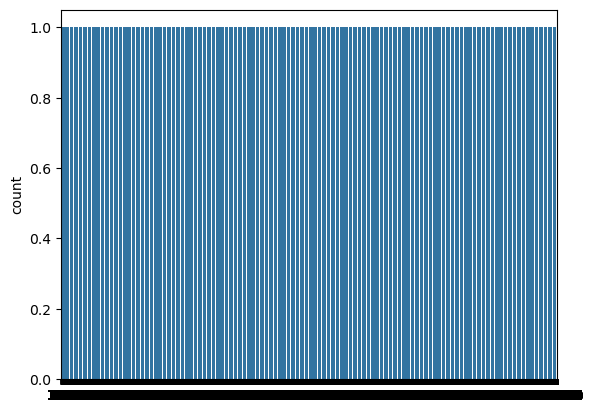

In [11]:
sns.countplot(data.target)
plt.show()

* In this plot we are clearly see that 90% customer did not do a transaction and 10% customer did the transaction
* This target feature is imbalance so we need to balance the data with the help of oversampling.

### IMPORTANT NOTE:

#### We did not perform any domain analysis on this dataset because it does not include feature names, as the data contains private customer information from the bank

### CHECKING DISTRIBUTION OF FIRST 100 FEATURE

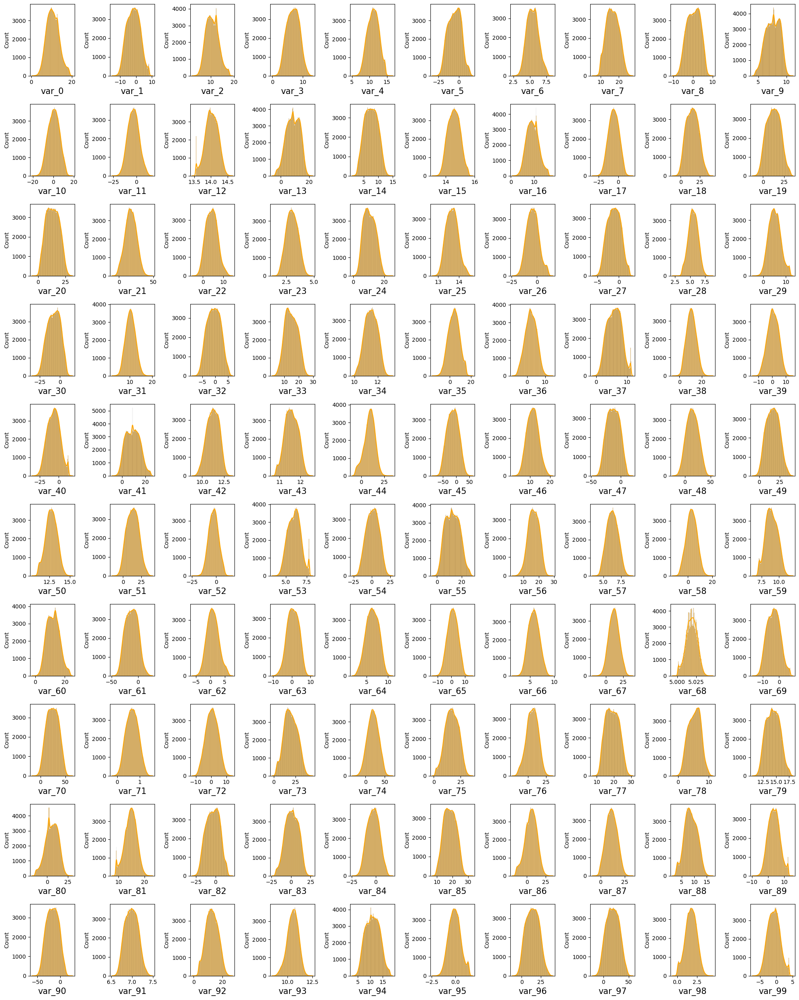

In [12]:
dist = data.iloc[:,2:102]
plt.figure(figsize=(20,25),facecolor='white') # Define canvas size
plotno = 1 # Counter
for column in dist: # Itreting the feature
    if plotno<=100: # Condition
        plt.subplot(10,10,plotno) # plotting 100 boxplot with 10 rows and 10 columN
        sns.histplot(dist[column],kde=True,color='orange')
        plt.xlabel(column,fontsize=15) # assigning name to x-axis and font size is 20
    plotno+=1
plt.tight_layout()
plt.show() # used to hide the storage loction

### CHECKING DISTRIBUTION OF REMAINING FEATURE

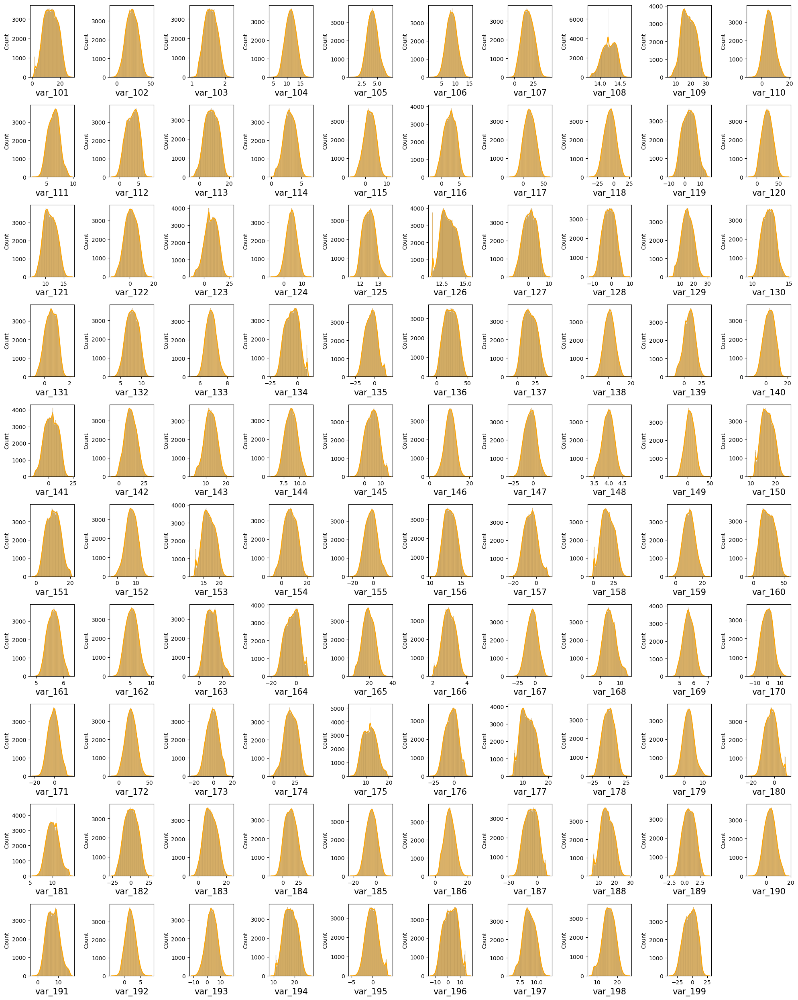

In [13]:
dist1 = data.iloc[:,103:]
plt.figure(figsize=(20,25),facecolor='white') # Define canvas size
plotno = 1 # Counter
for column in dist1: # Itreting the feature
    if plotno<=100: # Condition
        plt.subplot(10,10,plotno) # plotting 100 boxplot with 10 rows and 10 columN
        sns.histplot(dist1[column],kde=True,color='orange')
        plt.xlabel(column,fontsize=15) # assigning name to x-axis and font size is 20
    plotno+=1
plt.tight_layout()
plt.show() # used to hide the storage loction

##### OBSERVATION:

* From above both plots we are clearly see that most of the feature is follow a normal distribution and some feature are very close to the noramal distribution so we not need to use feature transformation technique.

### STATISTICAL ANALYSIS

##### DISTRIBUTION OF MEAN AND STANDARD DEVIATION OF THE DATA

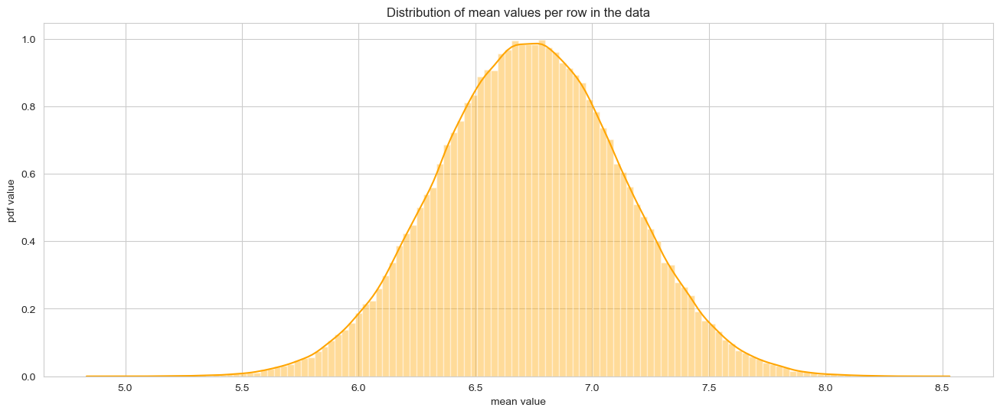

In [15]:
plt.figure(figsize=(16,6))
sns.set_style('whitegrid')
features = data.columns.values[1:202]
plt.title('Distribution of mean values per row in the data')
plt.xlabel('mean value')
plt.ylabel('pdf value')
sns.distplot(data[features].mean(axis=1),color='ORANGE', kde=True,bins=120)
plt.show()

* From the above graph looks like guassian distribution with mean value 6.73
* From above graph we can say that around 80% feature mean lies between 6.5 to 7.0

#### DISTRIBUTION OF STANDARD DEVIATION OF DATA

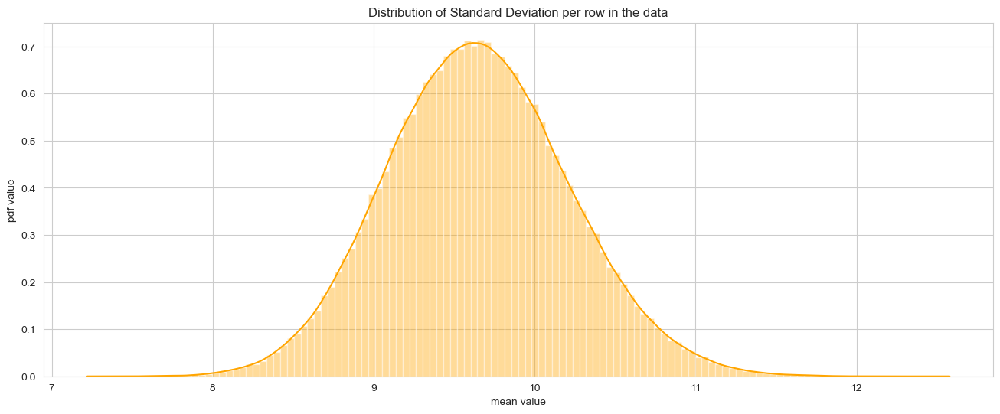

In [16]:
plt.figure(figsize=(16,6))
sns.set_style('whitegrid')
features = data.columns.values[1:202]
plt.title('Distribution of Standard Deviation per row in the data')
plt.xlabel('mean value')
plt.ylabel('pdf value')
sns.distplot(data[features].std(axis=1),color='ORANGE', kde=True,bins=120)
plt.show()

##### OBSERVATION:

* This graph also look like guassian distribution around 60% of feature standard deviation around the range of 9 to 10.

### DATA PREPROCESSING / FEATURE ENGINEERING

#### 1. CHECK MISSING VALUE

In [17]:
data.isnull().sum()

ID_code    0
target     0
var_0      0
var_1      0
var_2      0
          ..
var_195    0
var_196    0
var_197    0
var_198    0
var_199    0
Length: 202, dtype: int64

In [18]:
def missing_value(data):
    null_value = data.isnull().sum()
    percentage = (data.isnull().sum()/data.isnull().count()*100)
    null_value = pd.concat([null_value,percentage],axis=1,keys=['Missing Number','Missing Percentage'])
    return null_value
pd.set_option('display.max_rows',None)
missing_value(data)

,Missing Number,Missing Percentage
ID_code,0,0.0
target,0,0.0
var_0,0,0.0
var_1,0,0.0
var_2,0,0.0
var_3,0,0.0
var_4,0,0.0
var_5,0,0.0
var_6,0,0.0
var_7,0,0.0


* In this dataset there are no missing values

#### 2. OUTLIER HANDLING

* From the above EDA we have seen that the feature are very close to the normal distribution as well as distance between point is very less so we will not impute the outlier,we are using scaling to robust the outlier

#### 3. FEATURE SCALING

##### ROBUST SCALING

* Here we are using robust scaling because the data set contain the outlier but feature is following a normal distribution
* robust scaler is similar to normalization but it instead uses the interquatile range, so that it is robust to outlier

In [21]:
from sklearn.preprocessing import RobustScaler # Import library
scaler = RobustScaler() # Object creation
data[['var_0','var_1','var_2','var_3','var_4','var_5','var_6','var_7','var_8','var_9','var_10','var_11','var_12','var_13',
      'var_14','var_15','var_16','var_17','var_18','var_19','var_20','var_21','var_22','var_23','var_24','var_25','var_26',
      'var_27','var_28','var_29','var_30','var_31','var_32','var_33','var_34','var_35','var_36','var_37','var_38','var_39',
      'var_40','var_41','var_42','var_43','var_44','var_45','var_46','var_47','var_48','var_49','var_50','var_51','var_52',
      'var_53','var_54','var_55','var_56','var_57','var_58','var_59','var_60','var_61','var_62','var_63','var_64','var_65',
      'var_66','var_67','var_68','var_69','var_70','var_71','var_72','var_73','var_74','var_75','var_76','var_77','var_78',
      'var_79','var_80','var_81','var_82','var_83','var_84','var_85','var_86','var_87','var_88','var_89','var_90','var_91',
      'var_92','var_93','var_94','var_95','var_96','var_97','var_98','var_99','var_100','var_101','var_102','var_103',
      'var_104','var_105','var_106','var_107','var_108','var_109','var_110','var_111','var_112','var_113','var_114',
      'var_115','var_116','var_117','var_118','var_119','var_120','var_121','var_122','var_123','var_124','var_125',
      'var_126','var_127','var_128','var_129','var_130','var_131','var_132','var_133','var_134','var_135','var_136','var_137',
      'var_138','var_139','var_140','var_141','var_142','var_143','var_144','var_145','var_146','var_147','var_148','var_149',
      'var_150','var_151','var_152','var_153','var_154','var_155','var_156','var_157','var_158','var_159','var_160','var_161',
      'var_162','var_163','var_164','var_165','var_166','var_167','var_168','var_169','var_170','var_171','var_172','var_173',
      'var_174','var_175','var_176','var_177','var_178','var_179','var_180','var_181','var_182','var_183','var_184','var_185',
      'var_186','var_187','var_188','var_189','var_190','var_191','var_192','var_193','var_194','var_195','var_196','var_197',
      'var_198','var_199',]] = scaler.fit_transform(data[['var_0','var_1','var_2','var_3','var_4','var_5','var_6','var_7',
      'var_8','var_9','var_10','var_11','var_12','var_13',
      'var_14','var_15','var_16','var_17','var_18','var_19','var_20','var_21','var_22','var_23','var_24','var_25','var_26',
      'var_27','var_28','var_29','var_30','var_31','var_32','var_33','var_34','var_35','var_36','var_37','var_38','var_39',
      'var_40','var_41','var_42','var_43','var_44','var_45','var_46','var_47','var_48','var_49','var_50','var_51','var_52',
      'var_53','var_54','var_55','var_56','var_57','var_58','var_59','var_60','var_61','var_62','var_63','var_64','var_65',
      'var_66','var_67','var_68','var_69','var_70','var_71','var_72','var_73','var_74','var_75','var_76','var_77','var_78',
      'var_79','var_80','var_81','var_82','var_83','var_84','var_85','var_86','var_87','var_88','var_89','var_90','var_91',
      'var_92','var_93','var_94','var_95','var_96','var_97','var_98','var_99','var_100','var_101','var_102','var_103',
      'var_104','var_105','var_106','var_107','var_108','var_109','var_110','var_111','var_112','var_113','var_114',
      'var_115','var_116','var_117','var_118','var_119','var_120','var_121','var_122','var_123','var_124','var_125',
      'var_126','var_127','var_128','var_129','var_130','var_131','var_132','var_133','var_134','var_135','var_136','var_137',
      'var_138','var_139','var_140','var_141','var_142','var_143','var_144','var_145','var_146','var_147','var_148','var_149',
      'var_150','var_151','var_152','var_153','var_154','var_155','var_156','var_157','var_158','var_159','var_160','var_161',
      'var_162','var_163','var_164','var_165','var_166','var_167','var_168','var_169','var_170','var_171','var_172','var_173',
      'var_174','var_175','var_176','var_177','var_178','var_179','var_180','var_181','var_182','var_183','var_184','var_185',
      'var_186','var_187','var_188','var_189','var_190','var_191','var_192','var_193','var_194','var_195','var_196','var_197',
      'var_198','var_199']])

In [22]:
data.head()

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,-0.371543,-0.849081,0.350032,-0.564165,0.148216,-0.367026,-0.215656,0.420577,-1.011036,-0.957762,0.305583,0.773493,-0.043671,-1.114937,0.366513,-0.008174,-0.966624,-0.162739,-0.922003,1.501988,-0.287712,-0.087983,-0.412584,-0.697739,0.682295,-0.564694,-0.115641,0.311940,-0.548520,0.288457,0.576435,0.841940,-0.851126,0.348616,-0.299471,0.903673,-0.340591,0.581356,-0.981379,0.548539,0.115367,-0.193612,0.319345,1.040799,0.283599,0.173463,-1.324016,-0.105497,0.088093,-0.953893,0.180010,1.287471,0.258004,-0.771426,-0.161079,0.250831,-1.036505,-0.760518,-0.191132,0.969281,0.663865,0.953312,0.457902,-0.194641,1.045515,1.563864,0.014637,1.021941,-0.811881,-0.235622,-0.152782,-0.260393,0.797759,-0.940584,1.177347,0.171753,-0.770042,0.737181,0.354058,-1.091074,0.705281,-0.322230,0.354930,0.149136,-0.217689,0.526629,0.308423,0.631770,-0.169341,-1.068672,-0.245199,-0.889417,-0.256259,-0.788603,0.905459,0.326678,-0.415107,-0.116685,0.408769,-1.002733,1.191061,-0.009283,0.334864,-0.454611,1.145443,1.539743,0.354209,-0.037369,-0.441993,0.901512,-0.635917,0.267546,0.203524,-1.270972,-0.393360,-0.198976,0.038224,-0.019047,-0.655480,0.678865,-0.479367,-0.576777,-0.040617,-0.724279,-0.020919,-1.020520,0.573672,-0.345920,-0.166804,0.003252,0.448584,-0.285488,0.842093,-0.453821,1.045512,0.653827,0.403910,1.027436,0.252403,0.700201,0.661924,-0.828965,0.881523,-0.262672,0.034931,0.598285,0.337620,-1.233241,0.117986,0.866341,0.477374,0.108810,0.313432,0.015391,0.469908,0.456423,-0.694127,-1.039317,-0.002129,0.226414,-0.496664,-0.995956,-0.852672,-0.757186,1.106464,-0.907538,-0.478894,0.302331,1.120384,-0.275810,-0.750177,-0.992302,0.092748,0.431413,-0.155465,-0.900226,-0.683989,0.481938,-0.202353,-0.210354,-0.745271,-0.529248,0.172926,0.860504,0.965631,1.451151,0.656221,-0.535886,0.399552,-0.106880,0.190533,-0.776912,0.599643,-0.303378,0.118478,-1.112383,0.643194,-0.242223,-0.744683,0.107705
1,train_1,0,0.226713,-0.416363,0.864155,-0.467749,0.527324,0.979489,0.190804,0.014925,0.523831,0.231733,-0.111621,1.356555,-0.005922,-0.026486,-0.597899,-1.428478,1.275230,-1.026186,-0.624927,1.325749,-1.055828,-1.256152,1.040491,0.471547,-0.579970,0.561012,-0.919817,-0.613938,-0.443401,-1.213627,-0.153128,-0.825920,0.449260,0.722049,-0.080039,-0.431143,0.134638,-0.016755,0.042161,0.514962,-0.376309,-0.789331,-1.308709,0.475694,-1.053919,-1.092571,-0.967908,0.772529,1.189818,0.759215,-0.943863,-0.018056,-0.229100,0.596677,-0.746539,0.673046,0.514992,0.647343,-0.207278,-0.026

* Scale data successful

### FEATURE SELECTION

#### 1. DROP UNIQUE AND CONSTANT FEATURE

* Here we are going to drop id_code

In [24]:
data.drop('ID_code',axis=1,inplace=True)

In [25]:
data.head()

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,0,-0.371543,-0.849081,0.350032,-0.564165,0.148216,-0.367026,-0.215656,0.420577,-1.011036,-0.957762,0.305583,0.773493,-0.043671,-1.114937,0.366513,-0.008174,-0.966624,-0.162739,-0.922003,1.501988,-0.287712,-0.087983,-0.412584,-0.697739,0.682295,-0.564694,-0.115641,0.311940,-0.548520,0.288457,0.576435,0.841940,-0.851126,0.348616,-0.299471,0.903673,-0.340591,0.581356,-0.981379,0.548539,0.115367,-0.193612,0.319345,1.040799,0.283599,0.173463,-1.324016,-0.105497,0.088093,-0.953893,0.180010,1.287471,0.258004,-0.771426,-0.161079,0.250831,-1.036505,-0.760518,-0.191132,0.969281,0.663865,0.953312,0.457902,-0.194641,1.045515,1.563864,0.014637,1.021941,-0.811881,-0.235622,-0.152782,-0.260393,0.797759,-0.940584,1.177347,0.171753,-0.770042,0.737181,0.354058,-1.091074,0.705281,-0.322230,0.354930,0.149136,-0.217689,0.526629,0.308423,0.631770,-0.169341,-1.068672,-0.245199,-0.889417,-0.256259,-0.788603,0.905459,0.326678,-0.415107,-0.116685,0.408769,-1.002733,1.191061,-0.009283,0.334864,-0.454611,1.145443,1.539743,0.354209,-0.037369,-0.441993,0.901512,-0.635917,0.267546,0.203524,-1.270972,-0.393360,-0.198976,0.038224,-0.019047,-0.655480,0.678865,-0.479367,-0.576777,-0.040617,-0.724279,-0.020919,-1.020520,0.573672,-0.345920,-0.166804,0.003252,0.448584,-0.285488,0.842093,-0.453821,1.045512,0.653827,0.403910,1.027436,0.252403,0.700201,0.661924,-0.828965,0.881523,-0.262672,0.034931,0.598285,0.337620,-1.233241,0.117986,0.866341,0.477374,0.108810,0.313432,0.015391,0.469908,0.456423,-0.694127,-1.039317,-0.002129,0.226414,-0.496664,-0.995956,-0.852672,-0.757186,1.106464,-0.907538,-0.478894,0.302331,1.120384,-0.275810,-0.750177,-0.992302,0.092748,0.431413,-0.155465,-0.900226,-0.683989,0.481938,-0.202353,-0.210354,-0.745271,-0.529248,0.172926,0.860504,0.965631,1.451151,0.656221,-0.535886,0.399552,-0.106880,0.190533,-0.776912,0.599643,-0.303378,0.118478,-1.112383,0.643194,-0.242223,-0.744683,0.107705
1,0,0.226713,-0.416363,0.864155,-0.467749,0.527324,0.979489,0.190804,0.014925,0.523831,0.231733,-0.111621,1.356555,-0.005922,-0.026486,-0.597899,-1.428478,1.275230,-1.026186,-0.624927,1.325749,-1.055828,-1.256152,1.040491,0.471547,-0.579970,0.561012,-0.919817,-0.613938,-0.443401,-1.213627,-0.153128,-0.825920,0.449260,0.722049,-0.080039,-0.431143,0.134638,-0.016755,0.042161,0.514962,-0.376309,-0.789331,-1.308709,0.475694,-1.053919,-1.092571,-0.967908,0.772529,1.189818,0.759215,-0.943863,-0.018056,-0.229100,0.596677,-0.746539,0.673046,0.514992,0.647343,-0.207278,-0.026154,-0.653387,0.263081,0

#### 2. CHECKING CORRELATION

In [26]:
data.corr()

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
target,1.000000,0.052390,0.050343,0.055870,0.011055,0.010915,0.030979,6.673085e-02,-0.003025,0.019584,-0.042805,-0.002213,0.022993,-6.948928e-02,-0.055156,-0.006332,0.017283,0.008117,0.000864,0.043479,0.011291,-0.018329,-0.058483,0.060558,-0.025473,0.028477,0.013328,0.062422,-5.818916e-04,-0.023942,0.004682,0.000638,-0.025619,0.030513,-0.044334,-0.052692,0.036567,-0.038397,0.007685,0.000970,-0.004090,0.049530,-0.001298,-0.008365,-0.028557,-4.903939e-02,-0.020065,0.005690,0.008983,0.032334,0.030612,-0.013900,0.025992,0.027754,0.063399,-0.015796,0.017176,-0.035000,-0.015468,-0.024277,-0.010448,0.006265,0.007407,0.013888,-0.014670,-0.013805,0.011214,0.023114,0.044673,-0.011957,0.008283,0.026748,0.033607,-0.013005,-0.006460,0.019926,-3.808113e-02,-0.061917,-0.017459,0.048245,0.007591,-0.057609,-0.080917,0.022574,-0.020528,0.012363,-0.024513,-0.039126,-0.035860,-0.020677,0.039369,0.029395,0.040127,-0.046295,-0.035070,0.046296,0.038531,0.003037,0.015224,-0.004074,0.058367,2.215327e-03,-0.009138,-0.018329,-0.001395,-0.026605,0.025604,0.032947,-0.039997,-0.044791,-4.992600e-02,0.064275,0.026686,0.023694,-0.013681,-0.026266,-0.050174,-2.344771e-02,0.002591,0.040358,0.030975,-0.010895,-0.039788,-0.042461,-0.040291,0.004218,0.028223,1.392930e-03,-0.039125,0.026909,-0.005880,0.029917,-0.032380,-0.024510,0.054548,0.017213,0.027944,-0.003554,0.027190,0.018328,-0.074080,0.015301,-0.029701,-1.890064e-02,-0.011202,2.120786e-02,0.030917,-0.063644,0.040280,-0.055011,-0.047319,-2.582110e-02,0.027524,-0.010773,-0.007103,-0.046106,0.037240,-0.020997,0.032642,-0.003817,0.015278,-0.005135,0.004168,0.032647,0.031811,0.040997,-0.055734,-0.057773,0.030797,0.014115,-0.048382,0.047973,0.014873,-0.037976,4.202224e-02,-0.061669,0.021692,0.007469,-3.686307e-02,-0.019681,0.050002,0.031190,1.371375e-02,-0.007198,-0.005467,0.048315,0.000053,-0.030421,0.014873,-0.034015,0.009212,0.055973,4.711368e-02,-0.042858,-0.017709,-0.022838,0.028285,0.023608,-0.035303,-0.053000,0.025434
var_0,0.052390,1.000000,-0.000544,0.006573,0.003801,0.001326,0.003046,6.982549e-03,0.002429,0.004962,-0.002613,0.000355,0.003468,-1.995731e-03,-0.002717,-0.004584,-0.000043,0.001112,-0.001664,0.004292,0.001505,-0.000932,0.000781,0.002322,-0.000987,0.003658,0.001158,0.006117,9.846974e-04,0.001081,-0.000426,0.003187,-0.002097,0.000274,-0.003343,-0.003933,0.001469,-0.002556,-0.000253,-0.000470,-0.001409,0.006798,0.001152,-0.000440,0.002685,-3.003208e-03,-0.001539,0.000129,0.004062,0.003767,0.000524,-0.004678,0.001217,0.00303

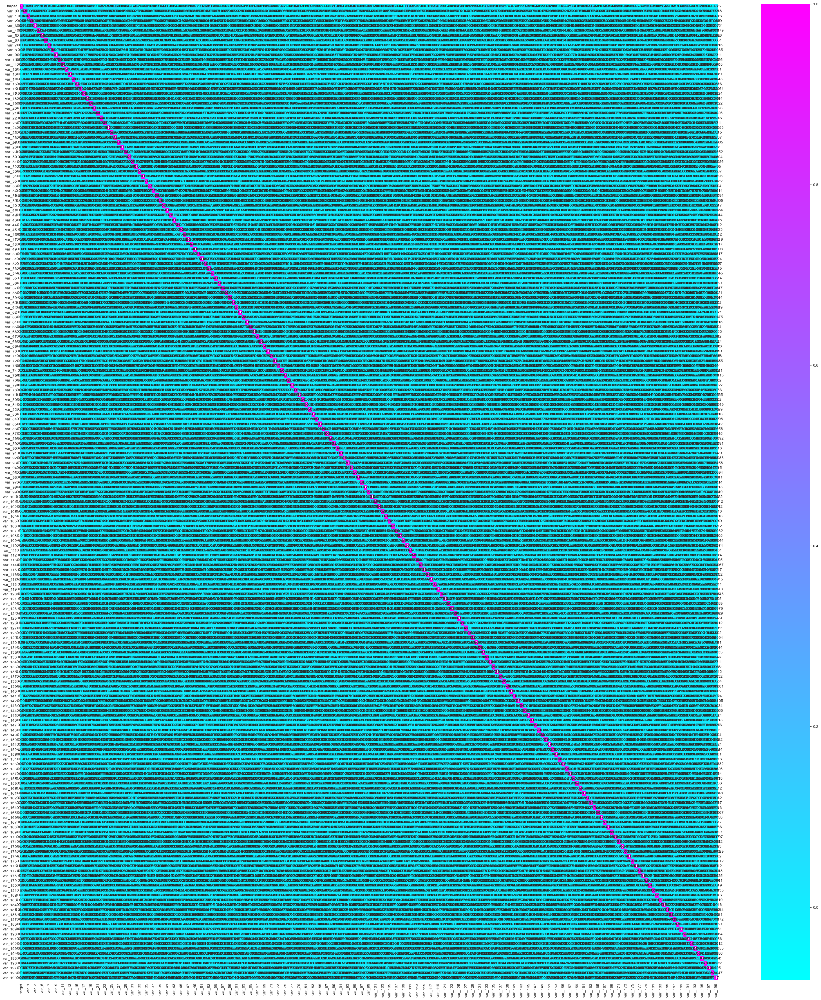

In [27]:
# Plot hitmap for better visualisation
plt.figure(figsize=(40,45))
sns.heatmap(data.corr(),annot=True,cmap='cool')
plt.show()

* From above heatmap scale we are clearly see that there is no highly correlated feature in data
* But we confirm with the help of python code

In [28]:
# To get highly corelated feature 
pd.set_option('display.max_rows',None)
corrmat = data.corr()
corrmat = corrmat.abs().unstack()
corrmat = corrmat.sort_values(ascending=False)
corrmat = corrmat [corrmat >= 0.9] # Set threshold 0.9
corrmat = corrmat [corrmat < 1]
corrmat = pd.DataFrame(corrmat).reset_index()
corrmat.columns = ['feature1','feature2','corr']
corrmat

,feature1,feature2,corr


* There is no highly correlated feature in dataset

#### 3.CHECKING DUPLICATES

In [31]:
data.duplicated().sum()

np.int64(0)

* There is no duplicate available on data

#### 4. PRINCIPLE COMPONENT ANALYSIS

* Reduce the feature with the help of pca

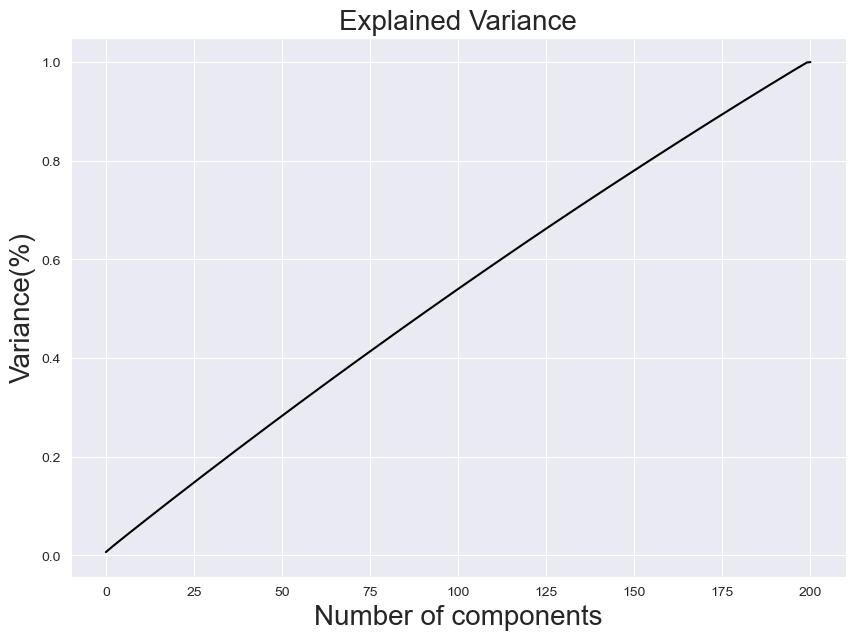

In [33]:
# Getting the optimal value of pca
from sklearn.decomposition import PCA
pca = PCA() # Object creation
principlecomponent = pca.fit_transform(data)  # Fitting the data
plt.figure(figsize=(10,7))
sns.set_style('darkgrid')
plt.plot(np.cumsum(pca.explained_variance_ratio_),color ='k')
plt.xlabel('Number of components',fontsize=20)
plt.ylabel('Variance(%)',fontsize=20) # for each componant
plt.title('Explained Variance',fontsize=20)
plt.show()


* In this plot we clearly see that the line of no of components are straight means the feature is more important so we are going to select 175 feature because of less variance loss

In [35]:
# Selecting the components
pca = PCA(n_components=175)
new_data = pca.fit_transform(data)
new_data

array([[ 0.51758867,  0.26955976,  0.05402251, ..., -0.91197506,
         0.02825685, -0.01823824],
       [-1.32400732, -0.53357927,  1.95817087, ..., -0.11897006,
        -0.04993349, -0.091531  ],
       [ 0.04224386, -0.81522866, -0.3257926 , ..., -0.04433698,
        -1.15220835, -0.52020052],
       ...,
       [-0.01423866,  0.55522966,  0.65142503, ..., -0.13624811,
        -0.40374922,  0.61777042],
       [ 0.40689894,  0.23820526,  0.38221209, ...,  0.55847262,
         0.11239184, -0.75789081],
       [ 0.76575485, -0.16503883,  0.39951196, ..., -1.09182605,
        -0.47622989,  0.67725346]])

In [36]:
# Create a new dataframe
principle_df = pd.DataFrame(data=new_data,columns=['pca1','pca2','pca3','pca4','pca5','pca6','pca7','pca8','pca9','pca10',
                            'pca11','pca12','pca13','pca14','pca15','pca16','pca17','pca18','pca19','pca20','pca21','pca22',
                            'pca23','pca24','pca25','pca26','pca27','pca28','pca29','pca30','pca31','pca32','pca33','pca34',
                            'pca35','pca36','pca37','pca38','pca39','pca40','pca41','pca42','pca43','pca44','pca45','pca46',
                            'pca47','pca48','pca49','pca50','pca51','pca52','pca53','pca54','pca55','pca56','pca57','pca58',
                            'pca59','pca60','pca61','pca62','pca63','pca64','pca65','pca66','pca67','pca68','pca69','pca70',
                            'pca71','pca72','pca73','pca74','pca75','pca76','pca77','pca78','pca79','pca80','pca81','pca82',
                            'pca83','pca84','pca85','pca86','pca87','pca88','pca89','pca90','pca91','pca92','pca93','pca94',
                            'pca95','pca96','pca97','pca98','pca99','pca100','pca101','pca102','pca103','pca104','pca105',
                            'pca106','pca107','pca108','pca109','pca110','pca111','pca112','pca113','pca114','pca115','pca116',
                            'pca117','pca118','pca119','pca120','pca121','pca122','pca123','pca124','pca125','pca126','pca127',
                            'pca128','pca129','pca130','pca131','pca132','pca133','pca134','pca135','pca136','pca137','pca138',
                            'pca139','pca140','pca141','pca142','pca143','pca144','pca145','pca146','pca147','pca148','pca149',
                            'pca150','pca151','pca152','pca153','pca154','pca155','pca156','pca157','pca158','pca159','pca160',
                            'pca161','pca162','pca163','pca164','pca165','pca166','pca167','pca168','pca169','pca170',
                            'pca171','pca172','pca173','pca174','pca175'])
principle_df.head()

,pca1,pca2,pca3,pca4,pca5,pca6,pca7,pca8,pca9,pca10,pca11,pca12,pca13,pca14,pca15,pca16,pca17,pca18,pca19,pca20,pca21,pca22,pca23,pca24,pca25,pca26,pca27,pca28,pca29,pca30,pca31,pca32,pca33,pca34,pca35,pca36,pca37,pca38,pca39,pca40,pca41,pca42,pca43,pca44,pca45,pca46,pca47,pca48,pca49,pca50,pca51,pca52,pca53,pca54,pca55,pca56,pca57,pca58,pca59,pca60,pca61,pca62,pca63,pca64,pca65,pca66,pca67,pca68,pca69,pca70,pca71,pca72,pca73,pca74,pca75,pca76,pca77,pca78,pca79,pca80,pca81,pca82,pca83,pca84,pca85,pca86,pca87,pca88,pca89,pca90,pca91,pca92,pca93,pca94,pca95,pca96,pca97,pca98,pca99,pca100,pca101,pca102,pca103,pca104,pca105,pca106,pca107,pca108,pca109,pca110,pca111,pca112,pca113,pca114,pca115,pca116,pca117,pca118,pca119,pca120,pca121,pca122,pca123,pca124,pca125,pca126,pca127,pca128,pca129,pca130,pca131,pca132,pca133,pca134,pca135,pca136,pca137,pca138,pca139,pca140,pca141,pca142,pca143,pca144,pca145,pca146,pca147,pca148,pca149,pca150,pca151,pca152,pca153,pca154,pca155,pca156,pca157,pca158,pca159,pca160,pca161,pca162,pca163,pca164,pca165,pca166,pca167,pca168,pca169,pca170,pca171,pca172,pca173,pca174,pca175
0,0.517589,0.269560,0.054023,-0.369893,0.835381,0.662795,1.319730,1.064223,-0.849499,0.433281,0.099748,0.189458,0.036275,0.666101,-0.022342,-0.761547,-0.166639,0.030342,-0.068087,1.435869,0.548179,1.059613,-1.190722,-0.729638,-0.071145,0.078544,-0.887911,-0.807112,0.012292,-0.763784,-0.274470,-0.372900,-0.263387,-0.002814,-0.656367,-0.047525,0.682693,0.054722,0.088106,0.400059,0.216680,-0.921100,0.608908,0.340632,0.704269,-0.170687,-0.654300,1.061424,-0.483177,1.065057,-1.490633,0.388312,-0.253202,0.513145,1.014501,-0.233567,-0.107051,-0.773744,0.066686,-0.477828,0.881100,0.525298,1.033929,0.201180,-0.691202,-0.487673,0.445280,-0.124135,-1.776024,-0.074610,-0.685690,0.032297,0.050818,0.034366,0.397986,-1.170827,0.368282,0.595141,1.006387,-0.382024,-0.535029,-0.493931,0.756615,0.714640,0.164489,0.506951,0.682040,-0.319673,1.048802,0.270264,0.624894,0.068417,-0.701790,0.475613,-0.198829,-0.755601,0.329829,-0.150092,1.165510,-1.094786,0.607245,0.807198,0.182657,0.224932,-1.100740,0.356435,0.452096,0.107081,-0.001502,1.180537,-0.631718,-0.756883,-1.088512,-0.304309,-0.186437,0.176686,-0.926008,-0.804948,0.792421,-1.048378,-0.797376,1.107738,0.291139,-0.053988,-1.002628,0.755661,-0.211778,0.234515,0.266976,-0.328136,0.648342,0.498883,0.522072,0.584286,-0.637994,0.123388,-0.333348,1.680633,0.620728,-0.031284,0.976753,-0.287220,0.397111,-0.959304,0.769188,-0.401486,-0.294892,-0.331451,0.103151,-1.979216,0.167794,-0.214290,0.403365,-0.544890,0.547660,-0.513307,-0.598169,-0.702461,-0.554514,-0.282646,0.129703,-1.053936,-0.667963,-0.169669,-1.219645,-0.554410,-0.611039,1.112001,-0.258308,-0.751815,0.967646,-0.750007,-0.911975,0.028257,-0.018238
1,-1.324007,-0.533579,1.958171,1.308587,0.328150,0.049564,-1.179654,0.139923,0.443926,0.601061,0.507448,0.290780,-2.031748,-1.611884,-0.508465,0.886412,-0.154350,-0.436477,-0.736805,-0.529373,1.095882,-0.959536,1.069778,1.143183,2.077901,-0.579774,1.045354,0.939488,0.376925,0.163353,0.055867,-0.105673,0.970089,0.221928,0.833694,1.083230,-0.575362,1.052924,-0.173764,-0.949257,-0.279215,-0.698407,0.107007,-0.484972,-1.349184,0.738426,-0.073452,-0.602862,0.583670,-0.220609,0.306837,-0.204201,-0.228406,0.633989,-0.153384,0.466705,-0.628820,-0.603458,-1.086874,1.179418,0.334649,0.610178,-0.116334,0.111064,-0.683004,1.137632,-0.223746,-0.423983,0.800753,0.838010,-0.190419,-0.771438,0.256354,0.129691,-0.351200,0.497553,-1.241447,-0.499981,0.798423,-0.622427,-0.289117,0.650573,-0.136576,0.584297,0.110860,0.206038,0.438245,-0.541694,0.912810,0.077358,0.330347,1.128143,0.679547,-0.558082,0.370086,0.233700,-0.451091,0.351500,0.282666,1.002136,0.024931,1.136643,-0.046010,-0.513514,1.083092,1.365194,0.171206,0.028797,-0.311181,0.808733,0.251169,-0.152583,0.291193,-0.772977,0.671171,1.461625,0.492782,-0.479170,0.949655,0.332061,-0.031731,-0.234562,0.318108,-1.348991,-0.399963,-0.732549,-0.580642,0.558389,0.892253,

### MODEL CREATION

#### AIM

* In customer transaction prediction f1 score metrix is important so we need more focus to improve f1 score
* Create a sweet spot model (Low bias, Low variance)

#### HERE WE WILL BE EXPERIMENTING WITH THREE ALGORITHMS

1. Logistic Regression
2. Artificial Neural Network [MLP Classifier]
3. XGB Classifier

#### DEFINE INDEPENDENT AND DEPENDENT VARIABLE

In [38]:
X = principle_df
y = data.target

In [39]:
X.head()

,pca1,pca2,pca3,pca4,pca5,pca6,pca7,pca8,pca9,pca10,pca11,pca12,pca13,pca14,pca15,pca16,pca17,pca18,pca19,pca20,pca21,pca22,pca23,pca24,pca25,pca26,pca27,pca28,pca29,pca30,pca31,pca32,pca33,pca34,pca35,pca36,pca37,pca38,pca39,pca40,pca41,pca42,pca43,pca44,pca45,pca46,pca47,pca48,pca49,pca50,pca51,pca52,pca53,pca54,pca55,pca56,pca57,pca58,pca59,pca60,pca61,pca62,pca63,pca64,pca65,pca66,pca67,pca68,pca69,pca70,pca71,pca72,pca73,pca74,pca75,pca76,pca77,pca78,pca79,pca80,pca81,pca82,pca83,pca84,pca85,pca86,pca87,pca88,pca89,pca90,pca91,pca92,pca93,pca94,pca95,pca96,pca97,pca98,pca99,pca100,pca101,pca102,pca103,pca104,pca105,pca106,pca107,pca108,pca109,pca110,pca111,pca112,pca113,pca114,pca115,pca116,pca117,pca118,pca119,pca120,pca121,pca122,pca123,pca124,pca125,pca126,pca127,pca128,pca129,pca130,pca131,pca132,pca133,pca134,pca135,pca136,pca137,pca138,pca139,pca140,pca141,pca142,pca143,pca144,pca145,pca146,pca147,pca148,pca149,pca150,pca151,pca152,pca153,pca154,pca155,pca156,pca157,pca158,pca159,pca160,pca161,pca162,pca163,pca164,pca165,pca166,pca167,pca168,pca169,pca170,pca171,pca172,pca173,pca174,pca175
0,0.517589,0.269560,0.054023,-0.369893,0.835381,0.662795,1.319730,1.064223,-0.849499,0.433281,0.099748,0.189458,0.036275,0.666101,-0.022342,-0.761547,-0.166639,0.030342,-0.068087,1.435869,0.548179,1.059613,-1.190722,-0.729638,-0.071145,0.078544,-0.887911,-0.807112,0.012292,-0.763784,-0.274470,-0.372900,-0.263387,-0.002814,-0.656367,-0.047525,0.682693,0.054722,0.088106,0.400059,0.216680,-0.921100,0.608908,0.340632,0.704269,-0.170687,-0.654300,1.061424,-0.483177,1.065057,-1.490633,0.388312,-0.253202,0.513145,1.014501,-0.233567,-0.107051,-0.773744,0.066686,-0.477828,0.881100,0.525298,1.033929,0.201180,-0.691202,-0.487673,0.445280,-0.124135,-1.776024,-0.074610,-0.685690,0.032297,0.050818,0.034366,0.397986,-1.170827,0.368282,0.595141,1.006387,-0.382024,-0.535029,-0.493931,0.756615,0.714640,0.164489,0.506951,0.682040,-0.319673,1.048802,0.270264,0.624894,0.068417,-0.701790,0.475613,-0.198829,-0.755601,0.329829,-0.150092,1.165510,-1.094786,0.607245,0.807198,0.182657,0.224932,-1.100740,0.356435,0.452096,0.107081,-0.001502,1.180537,-0.631718,-0.756883,-1.088512,-0.304309,-0.186437,0.176686,-0.926008,-0.804948,0.792421,-1.048378,-0.797376,1.107738,0.291139,-0.053988,-1.002628,0.755661,-0.211778,0.234515,0.266976,-0.328136,0.648342,0.498883,0.522072,0.584286,-0.637994,0.123388,-0.333348,1.680633,0.620728,-0.031284,0.976753,-0.287220,0.397111,-0.959304,0.769188,-0.401486,-0.294892,-0.331451,0.103151,-1.979216,0.167794,-0.214290,0.403365,-0.544890,0.547660,-0.513307,-0.598169,-0.702461,-0.554514,-0.282646,0.129703,-1.053936,-0.667963,-0.169669,-1.219645,-0.554410,-0.611039,1.112001,-0.258308,-0.751815,0.967646,-0.750007,-0.911975,0.028257,-0.018238
1,-1.324007,-0.533579,1.958171,1.308587,0.328150,0.049564,-1.179654,0.139923,0.443926,0.601061,0.507448,0.290780,-2.031748,-1.611884,-0.508465,0.886412,-0.154350,-0.436477,-0.736805,-0.529373,1.095882,-0.959536,1.069778,1.143183,2.077901,-0.579774,1.045354,0.939488,0.376925,0.163353,0.055867,-0.105673,0.970089,0.221928,0.833694,1.083230,-0.575362,1.052924,-0.173764,-0.949257,-0.279215,-0.698407,0.107007,-0.484972,-1.349184,0.738426,-0.073452,-0.602862,0.583670,-0.220609,0.306837,-0.204201,-0.228406,0.633989,-0.153384,0.466705,-0.628820,-0.603458,-1.086874,1.179418,0.334649,0.610178,-0.116334,0.111064,-0.683004,1.137632,-0.223746,-0.423983,0.800753,0.838010,-0.190419,-0.771438,0.256354,0.129691,-0.351200,0.497553,-1.241447,-0.499981,0.798423,-0.622427,-0.289117,0.650573,-0.136576,0.584297,0.110860,0.206038,0.438245,-0.541694,0.912810,0.077358,0.330347,1.128143,0.679547,-0.558082,0.370086,0.233700,-0.451091,0.351500,0.282666,1.002136,0.024931,1.136643,-0.046010,-0.513514,1.083092,1.365194,0.171206,0.028797,-0.311181,0.808733,0.251169,-0.152583,0.291193,-0.772977,0.671171,1.461625,0.492782,-0.479170,0.949655,0.332061,-0.031731,-0.234562,0.318108,-1.348991,-0.399963,-0.732549,-0.580642,0.558389,0.892253,

In [40]:
y.head()

0    0
1    0
2    0
3    0
4    0
Name: target, dtype: int64

#### BALANCING THE TARGET COLUMN USING SMOTE

In [41]:
from collections import Counter
from imblearn.over_sampling import SMOTE #SMOTE(synthetic minority oversampling techinque)
sm = SMOTE() # obeject creation
print("unbalanced data   :  ",Counter(y))
X_sm,y_sm = sm.fit_resample(X,y)
print("balanced data:    :",Counter(y_sm))

unbalanced data   :   Counter({0: 179902, 1: 20098})
balanced data:    : Counter({0: 179902, 1: 179902})


##### SPLIT TRAINING AND TESTING DATA

In [42]:

from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X_sm,y_sm,random_state=42,test_size=0.30) 
# 30% data given to testing because the large amount of data

In [43]:

# Check shape of train and test
X_train.shape

(251862, 175)

In [44]:
X_test.shape

(107942, 175)

In [45]:
y_train.shape

(251862,)

In [46]:
y_test.shape

(107942,)

### 1. Logistic Regression

In [47]:

#Step:1 importing library
from sklearn.linear_model import LogisticRegression

# Step:2 Object creation 
log_reg = LogisticRegression()

# Step:3 fitting traing data
log_reg.fit(X_train,y_train)

# Step:4 Prediction on test data
log_test_predict = log_reg.predict(X_test)

# Step:5 Prediction on training data
log_train_predict = log_reg.predict(X_train)

#### EVALUATION

#### TRAINING ACCURACY

In [48]:
# Import library
from sklearn.metrics import accuracy_score,f1_score,recall_score,precision_score,classification_report,confusion_matrix
log_train_accuracy = accuracy_score(log_train_predict,y_train)
print("Training accuracy of Logistic regression model",log_train_accuracy*100)
print("Logistic regression training Classification report: \n",classification_report(log_train_predict,y_train))

Training accuracy of Logistic regression model 83.47626875034742
Logistic regression training Classification report: 
               precision    recall  f1-score   support

           0       0.83      0.84      0.83    124065
           1       0.84      0.83      0.84    127797

    accuracy                           0.83    251862
   macro avg       0.83      0.83      0.83    251862
weighted avg       0.83      0.83      0.83    251862



* Logistic regression training score is poor

#### TESTING ACCURACY

In [49]:
log_test_accuracy = accuracy_score(log_test_predict,y_test)
print("Testing accuracy of Logistic regression model",log_test_accuracy*100)
print("Logistic regression testing Classification report: \n",classification_report(log_test_predict,y_test))

Testing accuracy of Logistic regression model 83.57358581460413
Logistic regression testing Classification report: 
               precision    recall  f1-score   support

           0       0.83      0.84      0.83     53085
           1       0.84      0.83      0.84     54857

    accuracy                           0.84    107942
   macro avg       0.84      0.84      0.84    107942
weighted avg       0.84      0.84      0.84    107942



* Testing accuracy of logistic regression model is poor so we use bagging to improve accuracy and f1 score

In [51]:
# In heart customer transaction prediction f1 score is more important
log_f1_score = recall_score(log_test_predict,y_test)
log_f1_score*100

83.00672658001713

### USE BAGGING ON LOGISTIC REGRESSION MODEL

In [54]:
# Step:1 Create a logistic regression object for bagging
log_reg1 = LogisticRegression()

# Step:2 importing library
from sklearn.ensemble import BaggingClassifier
# Changed 'base_estimator' to 'estimator' to match newer scikit-learn versions
bagg = BaggingClassifier(estimator=log_reg1, n_estimators=50)
# estimator ---> algorithm which you want to pass
# n_estimators ---> number of base learners (corrected spelling)

# Step:3 fitting the Training data
bagg.fit(X_train, y_train)

# Step:4 prediction on test data
bagg_predict = bagg.predict(X_test)

#### EVALUATION

In [55]:
log_bagg_accuracy = accuracy_score(bagg_predict,y_test)
print("Testing accuracy of Logistic regession model after bagging",log_bagg_accuracy*100)
print("Logistic regression testing Classification report: \n",classification_report(bagg_predict,y_test))

Testing accuracy of Logistic regession model after bagging 83.56061588630932
Logistic regression testing Classification report: 
               precision    recall  f1-score   support

           0       0.83      0.84      0.83     53067
           1       0.84      0.83      0.84     54875

    accuracy                           0.84    107942
   macro avg       0.84      0.84      0.84    107942
weighted avg       0.84      0.84      0.84    107942



In [56]:
bagg_f1_score = f1_score(bagg_predict,y_test)
bagg_f1_score*100

83.69310506437296

* After applying bagging score has not improved.

### 2. ANN [MLP Classifier]

In [57]:
# Step:1 Importing library and object creation
from sklearn.neural_network import MLPClassifier
model = MLPClassifier(hidden_layer_sizes=(60,3),
                      learning_rate='constant',
                      max_iter=100,
                      random_state=42)

In [58]:
# Step:2 Fitting the training data
model.fit(X_train,y_train)

MLPClassifier(hidden_layer_sizes=(60, 3), max_iter=100, random_state=42)

In [59]:
# Step:3 Predicting the probability
mlp_prdict_probability = model.predict_proba(X_test)
mlp_prdict_probability

array([[9.99988685e-01, 1.13154974e-05],
       [8.08503837e-03, 9.91914962e-01],
       [1.79641219e-01, 8.20358781e-01],
       ...,
       [1.22605017e-02, 9.87739498e-01],
       [9.55545375e-01, 4.44546252e-02],
       [9.98252204e-01, 1.74779551e-03]])

In [60]:
# Step:4 Prediction on test data
mlp_test_predict = model.predict(X_test)

# Step:5 Prediction on training data
mlp_train_predict = model.predict(X_train)

#### EVALUATION

##### TRAINING ACCURACY

In [61]:
mlp_train_accuracy = accuracy_score(mlp_train_predict,y_train)
print("Training accuracy of MLP model is:",mlp_train_accuracy*100)
print("Classification report of training:"'\n',classification_report(mlp_train_predict,y_train))

Training accuracy of MLP model is: 93.74141394890853
Classification report of training:
               precision    recall  f1-score   support

           0       0.93      0.94      0.94    125207
           1       0.94      0.94      0.94    126655

    accuracy                           0.94    251862
   macro avg       0.94      0.94      0.94    251862
weighted avg       0.94      0.94      0.94    251862



* ANN MLP classifier model very well works on training data.

##### TESTING ACCURACY

In [63]:
mlp_test_accuracy = accuracy_score(mlp_test_predict,y_test)
print("Testing accuracy of MLP model is:",mlp_test_accuracy*100)
print("Classification report of testing:"'\n',classification_report(mlp_test_predict,y_test))

Testing accuracy of MLP model is: 90.17713216356933
Classification report of testing:
               precision    recall  f1-score   support

           0       0.89      0.91      0.90     53021
           1       0.91      0.89      0.90     54921

    accuracy                           0.90    107942
   macro avg       0.90      0.90      0.90    107942
weighted avg       0.90      0.90      0.90    107942



In [64]:
mlp_f1_score = f1_score(mlp_test_predict,y_test)
print('F1 Score',mlp_f1_score*100)

F1 Score 90.26041427456023


* ANN MLP classifier model testing accuracy is also good.

### 3. XGB Classifier

In [65]:
# Step:1 importing library and object creation
import xgboost
from xgboost import XGBClassifier
xgb = XGBClassifier()

# Step:2 fitting the training data
xgb.fit(X_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              feature_weights=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, ...)

In [66]:
# Step:3 Prediction on training data
xgb_train_predict = xgb.predict(X_train)

# Step:4 Prediction on testing data
xgb_test_predict = xgb.predict(X_test)

#### EVALUATION

##### TRAINING ACCURACY

In [67]:
xgb_train_accuracy = accuracy_score(xgb_train_predict,y_train)
print("Training accuracy XGB classifier:",xgb_train_accuracy*100)
print("Classification report of training:"'\n',classification_report(xgb_train_predict,y_train))

Training accuracy XGB classifier: 93.69773923815423
Classification report of training:
               precision    recall  f1-score   support

           0       0.93      0.94      0.94    125099
           1       0.94      0.93      0.94    126763

    accuracy                           0.94    251862
   macro avg       0.94      0.94      0.94    251862
weighted avg       0.94      0.94      0.94    251862



* XGB Classifier model also works very well on training data.

##### TESTING ACCURACY

In [68]:
xgb_test_accuracy = accuracy_score(xgb_test_predict,y_test)
print("Testing accuracy XGB classifier:",xgb_test_accuracy*100)
print("Classification report of training:"'\n',classification_report(xgb_test_predict,y_test))

Testing accuracy XGB classifier: 90.59494913935262
Classification report of training:
               precision    recall  f1-score   support

           0       0.90      0.91      0.91     53128
           1       0.91      0.90      0.91     54814

    accuracy                           0.91    107942
   macro avg       0.91      0.91      0.91    107942
weighted avg       0.91      0.91      0.91    107942



In [69]:
xgb_f1_score = f1_score(xgb_test_predict,y_test)
print("F1 score of xgb:",xgb_f1_score*100)

F1 score of xgb: 90.66551426101988


* XGB Classifier model accuracy score is also good.

#### NOTE:

* Since the dataset is very large, performing hyperparameter tuning on the XGBoost and MLP classifier models was extremely time-consuming. Even running the models on Jupiter did not solve the timing issue. Therefore, I decided to remove all hyperparameter tuning from the process.

### OBSERVATION:

* logistic regression model training and testing score is not good, even after applying bagging score is still lagging.
* ANN MLP Classifier model is very well working on training data as well as testing data, the score of training is 93.74 and testing score is 90.17 with f1 score is 90.26
* XGB Classifier model is also working well on training and testing side, the score of training 93.69 and testing score is 90.59 with f1 score is 90.66.
* From above all model we select ANN MLP Classifier because we use certain parameter like max_iter.

#### MODEL SAVING

In [72]:
# saving model with the help of pickle
import pickle

file = open('mlp_classifier_model.pkl','wb')
pickle.dump(model,file)